In [1]:
from imutils import face_utils
import dlib
import cv2
import matplotlib.pyplot as plt
import numpy as np
import sys
import imageio
from IPython.display import Image
np.set_printoptions(threshold=sys.maxsize)

In [2]:
model = "shape_predictor_68_face_landmarks.dat"
detector = dlib.get_frontal_face_detector()
predictor = dlib.shape_predictor(model)

In [3]:
def getPoints(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    rectangles = detector(gray, 0)
    for (i, rectangle) in enumerate(rectangles):
        shape = predictor(gray, rectangle)
        shape = face_utils.shape_to_np(shape)
    return shape

In [5]:
dwayne = cv2.imread("dwayne.jpg")
dwayne = cv2.cvtColor(dwayne, cv2.COLOR_BGR2RGB)
dwaynePoints = getPoints(dwayne)
vin = cv2.imread("vin.jpg")
vin = cv2.cvtColor(vin, cv2.COLOR_BGR2RGB)
vinPoints = getPoints(vin)

In [7]:
h, w, _ = vin.shape
print(dwayne.shape)

(474, 339, 3)


In [8]:
def convertToList(pts):
    points = []
    for p in pts:
        points.append([int(p[0]), int(p[1])])
    return points

In [9]:
vinPoints = convertToList(vinPoints)
dwaynePoints = convertToList(dwaynePoints)

In [10]:
# dwaynePoints.append([456, 32])
# dwaynePoints.append([202, 379])
# dwaynePoints.append([704, 379])
# dwaynePoints.append([293, 126])
# dwaynePoints.append([617, 134])
# dwaynePoints.append([200, 490])
# dwaynePoints.append([707, 476])
# dwaynePoints.append([5, 5])
# dwaynePoints.append([w - 5, 5])
# dwaynePoints.append([w - 5, h - 5])
# dwaynePoints.append([5, h - 5])

In [11]:
dwaynePoints.append([83,149])
dwaynePoints.append([81,114])
dwaynePoints.append([96,75])
dwaynePoints.append([133,31])
dwaynePoints.append([179,24])
dwaynePoints.append([221,31])
dwaynePoints.append([255,72])
dwaynePoints.append([261,112])
dwaynePoints.append([253,154])
dwaynePoints.append([95,174])
dwaynePoints.append([241,181])
dwaynePoints.append([99,197])
dwaynePoints.append([233,194])
dwaynePoints.append([172,293])
dwaynePoints.append([52,298])
dwaynePoints.append([294,275])
dwaynePoints.append([5, 5])
dwaynePoints.append([w - 5, 5])
dwaynePoints.append([w - 5, h - 5])
dwaynePoints.append([5, h - 5])

In [12]:
vinPoints.append([30,212])
vinPoints.append([21,149])
vinPoints.append([40,79])
vinPoints.append([77,31])
vinPoints.append([166,3])
vinPoints.append([241,25])
vinPoints.append([281,72])
vinPoints.append([298,134])
vinPoints.append([285,182])
vinPoints.append([40,254])
vinPoints.append([278,231])
vinPoints.append([47,283])
vinPoints.append([267,267])
vinPoints.append([174,441])
vinPoints.append([20,348])
vinPoints.append([317,283])
vinPoints.append([5, 5])
vinPoints.append([w - 5, 5])
vinPoints.append([w - 5, h - 5])
vinPoints.append([5, h - 5])

In [13]:
# vinPoints.append([292, 98])
# vinPoints.append([77, 571])
# vinPoints.append([764, 407])
# vinPoints.append([89, 287])
# vinPoints.append([610, 166])
# vinPoints.append([90, 684])
# vinPoints.append([813, 459])
# vinPoints.append([5, 5])
# vinPoints.append([w - 5, 5])
# vinPoints.append([w - 5, h - 5])
# vinPoints.append([5, h - 5])

In [14]:
def getTriangles(img, points):
    size = img.shape
    boundingRect = (0, 0, size[1], size[0])
    subdiv = cv2.Subdiv2D(boundingRect)
    for p in points:
        subdiv.insert(p)
    tList = subdiv.getTriangleList()
    return tList

In [15]:
def getCorrespondingTriangle(srcArrPts, destArrPts, triPoints):
    x1, y1, x2, y2, x3, y3 = triPoints
    destTri = [0] * 6
    for i in range(len(srcArrPts)):
        if(srcArrPts[i][0] == int(x1) and srcArrPts[i][1] == int(y1)):
            destTri[0] = destArrPts[i][0]
            destTri[1] = destArrPts[i][1]
        if(srcArrPts[i][0] == int(x2) and srcArrPts[i][1] == int(y2)):
            destTri[2] = destArrPts[i][0]
            destTri[3] = destArrPts[i][1]
        if(srcArrPts[i][0] == int(x3) and srcArrPts[i][1] == int(y3)):
            destTri[4] = destArrPts[i][0]
            destTri[5] = destArrPts[i][1]
    return destTri

In [17]:
def getPointsForMorphed(dwaynePoints, vinPoints, alpha):
    numOfPoints = len(dwaynePoints)
    morphPoints = [[0, 0] for i in range(numOfPoints)]
    for i in range(numOfPoints):
        xd = dwaynePoints[i][0]
        yd = dwaynePoints[i][1]
        xv = vinPoints[i][0]
        yv = vinPoints[i][1]
        morphPoints[i][0] = int(((1 - alpha) * xd) + (alpha * xv))
        morphPoints[i][1] = int(((1 - alpha) * yd) + (alpha * yv))
    return morphPoints

In [16]:
trianglesDwayne = getTriangles(dwayne, dwaynePoints)

In [18]:
def getCorrespondingTriangles(trianglesDwayne):
    trianglesVin = []
    trianglesMorphed = []
    for i in trianglesDwayne:
        trianglesVin.append(getCorrespondingTriangle(dwaynePoints, vinPoints, i))
        trianglesMorphed.append(getCorrespondingTriangle(dwaynePoints, morphedPoints, i))
    trianglesVin = np.array(trianglesVin)
    trianglesMorphed = np.array(trianglesMorphed)
    return (trianglesVin, trianglesMorphed)

In [19]:
dwayne_h, dwayne_w, _ = dwayne.shape

In [20]:
def applyAffineTransform(src, srcTri, dstTri, size) :
    warpMat = cv2.getAffineTransform( np.float32(srcTri), np.float32(dstTri) )
    dst = cv2.warpAffine( src, warpMat, (size[0], size[1]), None, flags=cv2.INTER_LINEAR, borderMode=cv2.BORDER_REFLECT_101 )

    return dst

In [21]:
def getOffset(rD, rM, rV, tD, tM, tV):
    offTriDw = [[0, 0], [0, 0], [0, 0]]
    offTriMorph = [[0,0], [0,0], [0,0]]
    offTriVin = [[0,0], [0,0], [0,0]]

    for i in range(3):
        offTriDw[i][0], offTriDw[i][1] = ((tD[i][0] - rD[0]), (tD[i][1] - rD[1]))
        offTriMorph[i][0], offTriMorph[i][1] = ((tM[i][0] - rM[0]), (tM[i][1] - rM[1]))
        offTriVin[i][0], offTriVin[i][1] = ((tV[i][0] - rV[0]), (tV[i][1] - rV[1]))
    
    return offTriDw, offTriMorph, offTriVin

In [22]:
def extractRect(rectangle, img):
    extractedRect = np.zeros((rectangle[3], rectangle[2]), dtype = np.uint8)
    x, y = rectangle[0], rectangle[1]
    
    for i in range(rectangle[3]):
        for j in range(rectangle[2]):
            extractedRect[i, j] = img[y + i, x + j]
    
    return extractedRect

In [23]:
def retMorphImage(trianglesDw, trianglesMorph, trianglesVin, img1, img2, morphedImg, alpha):
    for i in range(len(trianglesDw)):
        triDw = [[0,0], [0,0], [0,0]]
        triDw[0][0], triDw[0][1], triDw[1][0], triDw[1][1], triDw[2][0], triDw[2][1] = trianglesDw[i]
        rectangleDwayne = cv2.boundingRect(np.float32([triDw]))
        
        triMorph = [[0,0], [0,0], [0,0]]
        triMorph[0][0], triMorph[0][1], triMorph[1][0], triMorph[1][1], triMorph[2][0], triMorph[2][1] = trianglesMorph[i]
        rectangleMorph = cv2.boundingRect(np.float32([triMorph]))
        
#         print(i, trianglesVin[i])
        triVin = [[0,0], [0,0], [0,0]]
        triVin[0][0], triVin[0][1], triVin[1][0], triVin[1][1], triVin[2][0], triVin[2][1] = trianglesVin[i]
        rectangleVin = cv2.boundingRect(np.float32([triVin]))
        
        offTriDw, offTriMorph, offTriVin = getOffset(rectangleDwayne, rectangleMorph, rectangleVin, triDw, triMorph, triVin)
            
        mask = np.zeros((rectangleMorph[3], rectangleMorph[2]), dtype = np.float32)
        cv2.fillConvexPoly(mask, np.int32(offTriMorph), (1.0, 1.0, 1.0), 16, 0)
        
        dwayneRectExt = extractRect(rectangleDwayne,img1)
        vinRectExt = extractRect(rectangleVin, img2)
    
        size = (rectangleMorph[2], rectangleMorph[3])
        
        warpedWithDwayne = applyAffineTransform(dwayneRectExt, offTriDw, offTriMorph, size)
        warpedWithVin = applyAffineTransform(vinRectExt, offTriVin, offTriMorph, size)

        morphTr = (1.0 - alpha) * warpedWithDwayne + alpha * warpedWithVin
        
        morphImg = extractRect(rectangleMorph, morphedImg)
        morphImg = morphImg * ( 1 - mask ) + morphTr * mask
        
        x, y = rectangleMorph[0], rectangleMorph[1]
        
        for i in range(rectangleMorph[3]):
            for j in range(rectangleMorph[2]):
                morphedImg[y + i, x + j] = morphImg[i, j]
            
    return morphedImg

## Taking points using library

In [24]:
allImages = []
for i in range(1, 20):
    alpha = 0.05 * i
    morphedPoints = getPointsForMorphed(dwaynePoints, vinPoints, alpha)
    trianglesVin, trianglesMorphed = getCorrespondingTriangles(trianglesDwayne)
#     print(len(trianglesVin), len(trianglesDwayne), len(trianglesMorphed))
    morphedImg = np.zeros((dwayne_h, dwayne_w),dtype = int)
    dwayne_b, dwayne_g, dwayne_r = cv2.split(dwayne)
    vin_b, vin_g, vin_r = cv2.split(vin)
    morphed_b = retMorphImage(trianglesDwayne, trianglesMorphed, trianglesVin, np.copy(dwayne_b), np.copy(vin_b), np.copy(morphedImg), alpha)
    morphed_g = retMorphImage(trianglesDwayne, trianglesMorphed, trianglesVin, np.copy(dwayne_g), np.copy(vin_g), np.copy(morphedImg), alpha)
    morphed_r = retMorphImage(trianglesDwayne, trianglesMorphed, trianglesVin, np.copy(dwayne_r), np.copy(vin_r), np.copy(morphedImg), alpha)
    allImages.append(cv2.merge((morphed_b, morphed_g, morphed_r)))

In [25]:
allImages.insert(0, dwayne)
allImages.append(vin)

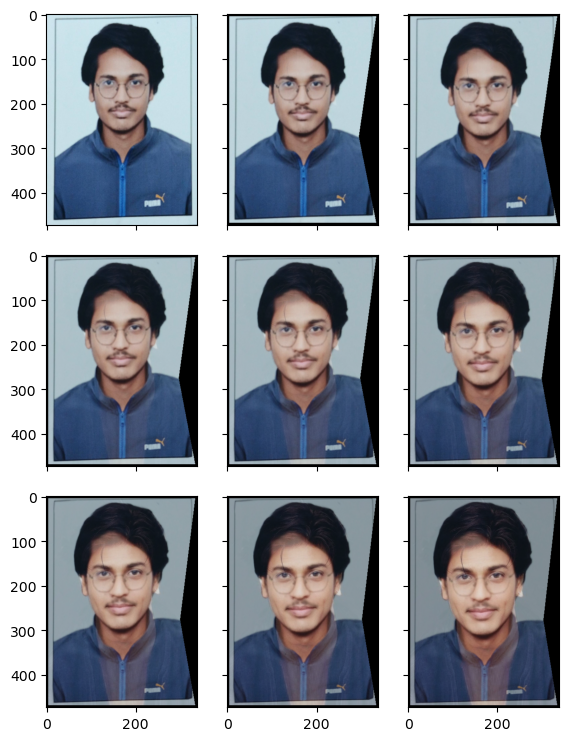

In [26]:
from mpl_toolkits.axes_grid1 import ImageGrid
fig = plt.figure(figsize=(9., 9.))
grid = ImageGrid(fig, 111, nrows_ncols=(3, 3), axes_pad=0.3,)
for ax, im in zip(grid, allImages):
    ax.imshow(im)
plt.show()

In [27]:
for i in range(len(allImages)):
    allImages[i] = allImages[i].astype(np.uint8)

In [28]:
imageio.mimsave('gifLib.gif', allImages, fps=5)

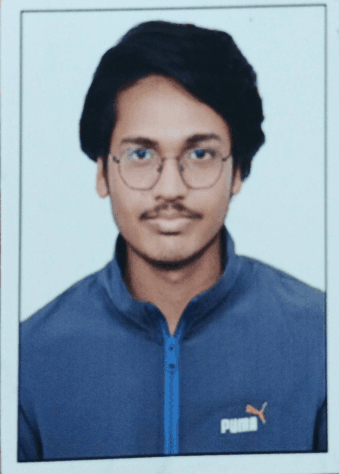

In [29]:
Image(filename="./gifLib.gif", width = 400, height = 200)

## Taking manual points

In [45]:
vinPointsManual = []
dwaynePointsManual = []

In [46]:
with open("points.txt", 'r') as file:
    data = file.readlines()
    for line in data:
        line = line.strip().split(" ")
        dx, dy, vx, vy = line
        dx, dy, vx, vy = int(dx), int(dy), int(vx), int(vy)
        dwaynePointsManual.append([dx, dy])
        vinPointsManual.append([vx, vy])
vinPointsManual.append([5, 5])
vinPointsManual.append([w - 5, 5])
vinPointsManual.append([w - 5, h - 5])
vinPointsManual.append([5, h - 5])
dwaynePointsManual.append([5, 5])
dwaynePointsManual.append([w - 5, 5])
dwaynePointsManual.append([w - 5, h - 5])
dwaynePointsManual.append([5, h - 5])

In [47]:
allImagesMan = []
for i in range(1, 20):
    alpha = 0.05 * i
    morphedPoints = getPointsForMorphed(dwaynePoints, vinPoints, alpha)
    trianglesVin, trianglesMorphed = getCorrespondingTriangles(trianglesDwayne)
#     print(len(trianglesVin), len(trianglesDwayne), len(trianglesMorphed))
    morphedImg = np.zeros((dwayne_h, dwayne_w),dtype = int)
    dwayne_b, dwayne_g, dwayne_r = cv2.split(dwayne)
    vin_b, vin_g, vin_r = cv2.split(vin)
    morphed_b = retMorphImage(trianglesDwayne, trianglesMorphed, trianglesVin, np.copy(dwayne_b), np.copy(vin_b), np.copy(morphedImg), alpha)
    morphed_g = retMorphImage(trianglesDwayne, trianglesMorphed, trianglesVin, np.copy(dwayne_g), np.copy(vin_g), np.copy(morphedImg), alpha)
    morphed_r = retMorphImage(trianglesDwayne, trianglesMorphed, trianglesVin, np.copy(dwayne_r), np.copy(vin_r), np.copy(morphedImg), alpha)
    allImagesMan.append(cv2.merge((morphed_b, morphed_g, morphed_r)))

In [52]:
allImagesMan.insert(0, dwayne)
allImagesMan.append(vin)

In [53]:
for i in range(len(allImagesMan)):
    allImagesMan[i] = allImagesMan[i].astype(np.uint8)

In [54]:
imageio.mimsave('gifMan.gif', allImages, fps=5)

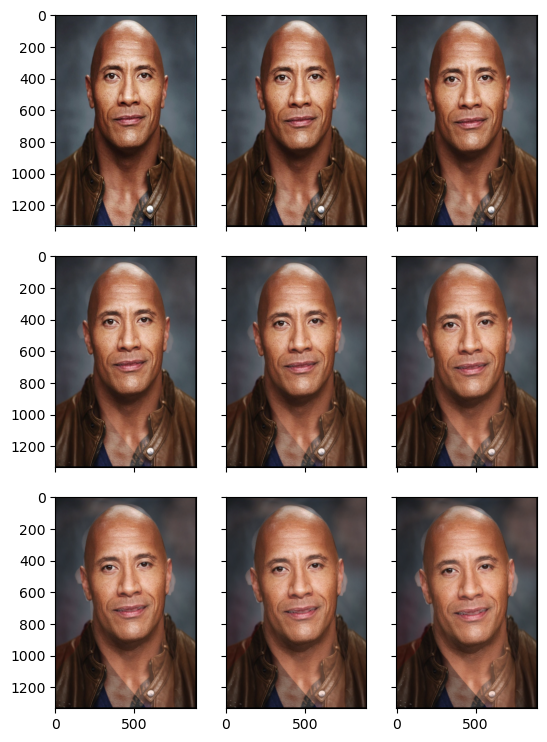

In [58]:
fig = plt.figure(figsize=(9., 9.))
grid = ImageGrid(fig, 111, nrows_ncols=(3, 3), axes_pad=0.3,)
for ax, im in zip(grid, allImages):
    ax.imshow(im)
plt.show()

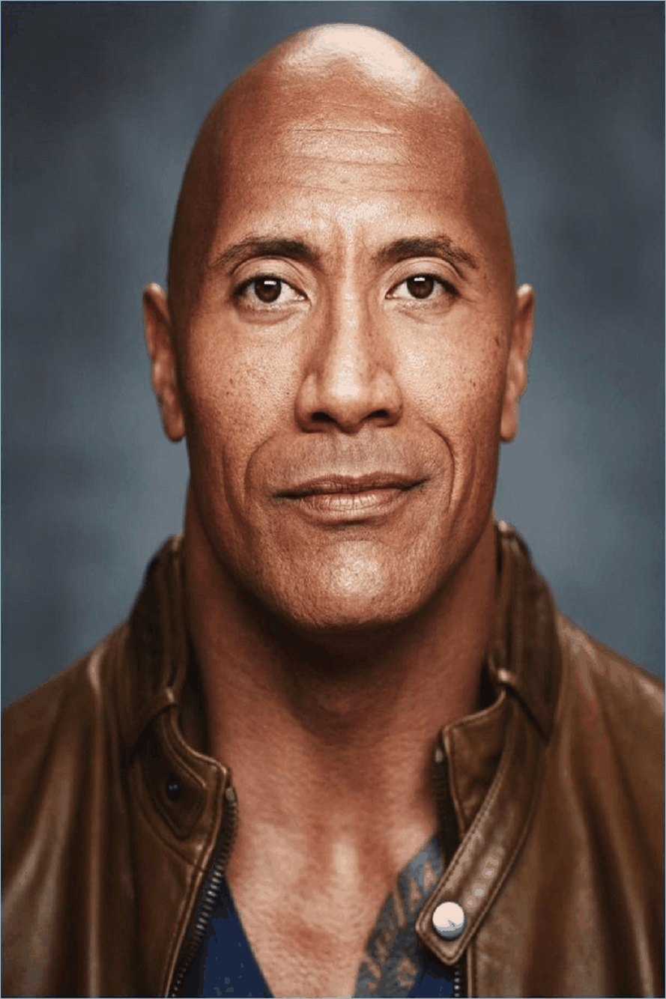

In [69]:
Image(filename="./gifMan.gif", width = 400, height = 200)